In [77]:
import numpy as np

def Generate(conditional_number): 
    # Generate a random orthogonal matrix Q
    Q = np.linalg.qr(np.random.randn(2, 2))[0]

    # Create a diagonal matrix with the desired eigenvalues
    eigenvalues = np.array([conditional_number, 1])
    D = np.diag(eigenvalues)

    # Construct the matrix A
    A = Q.T @ D @ Q
    
    # Define the quadratic function
    def quadratic(r):
        return 0.5*(r.T @ A @ r)

    return A,quadratic

In [83]:
def Gradient_descent(A,loss_target, ite_max, learning_rate):
    # Initialize the alpha vector at [1,1]
    alpha_values = np.zeros((ite_max,2))
    alpha = np.ones(2)*-1
    
    i=0
    alpha_values[i]=alpha

    # Perform the gradient descent
    while 0.5*alpha.T@A@alpha  > loss_target and i< ite_max-1: 
        # Compute the gradient
        gradient = (A@alpha)
        # Update the alpha vector
        alpha -= learning_rate * gradient

        i+=1
        alpha_values[i]=alpha

    return alpha_values[:i+1]

In [3]:
def Chebyshev(A,loss_target,ite_max,L,mu):
    # Initialize the alpha vector at [1,1]
    alpha_values= np.zeros((ite_max,2))
    alpha = np.ones(2)

    i=0
    alpha_values[i]=alpha

    # Compute the parameters of the Chebyshev method
    rho= (L-mu)/(L+mu)
    h= 2/(L+mu) 
    w = 2

    # Perform the first iteration of the Chebyshev method
    gradient = (A@alpha) + np.array([1,1])
    alpha = alpha - h*gradient
    i+=1
    alpha_values[i]=alpha
    
    # Perform the Chebyshev method
    while 0.5*alpha.T@A@alpha + np.dot(alpha,np.array([1, 1])) > loss_target and i< ite_max-1: 
        # Compute the gradient
        gradient = (A@alpha) + np.array([1,1])
        # Update the value w and the alpha vector
        w= 1/(1-rho*rho/4*w)
        alpha += (w-1)*(alpha-alpha_values[i-1]) - w*h * gradient

        i+=1
        alpha_values[i]=alpha

    return alpha_values[:i+1]

Smallest eigenvalue of A_10: 1.0
Largest eigenvalue of A_10: 9.999999999999998
Constante of smoothness for A_10: 9.999999999999996
Number iteration for 1/L stepsize: 59


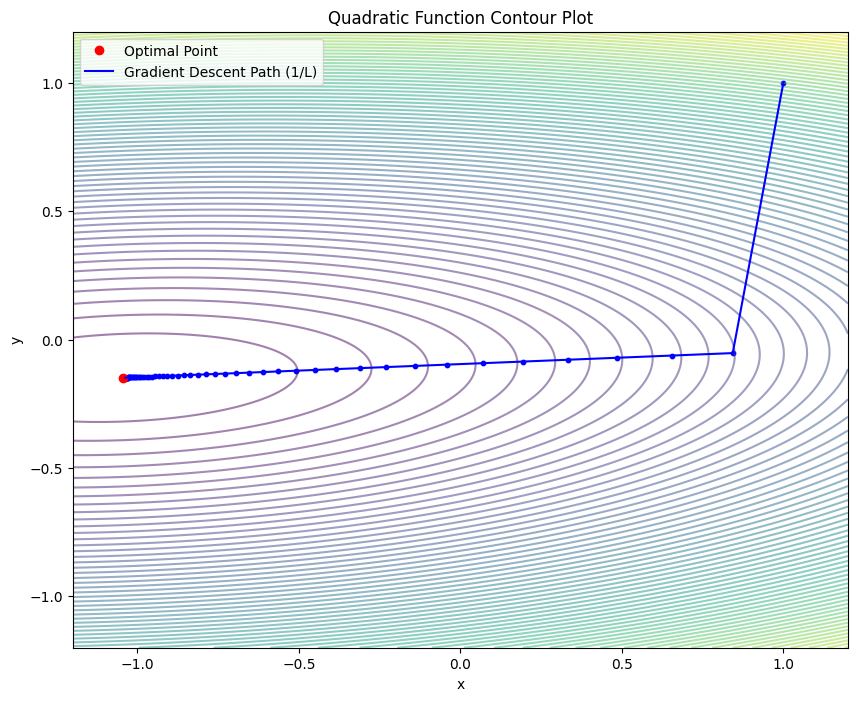

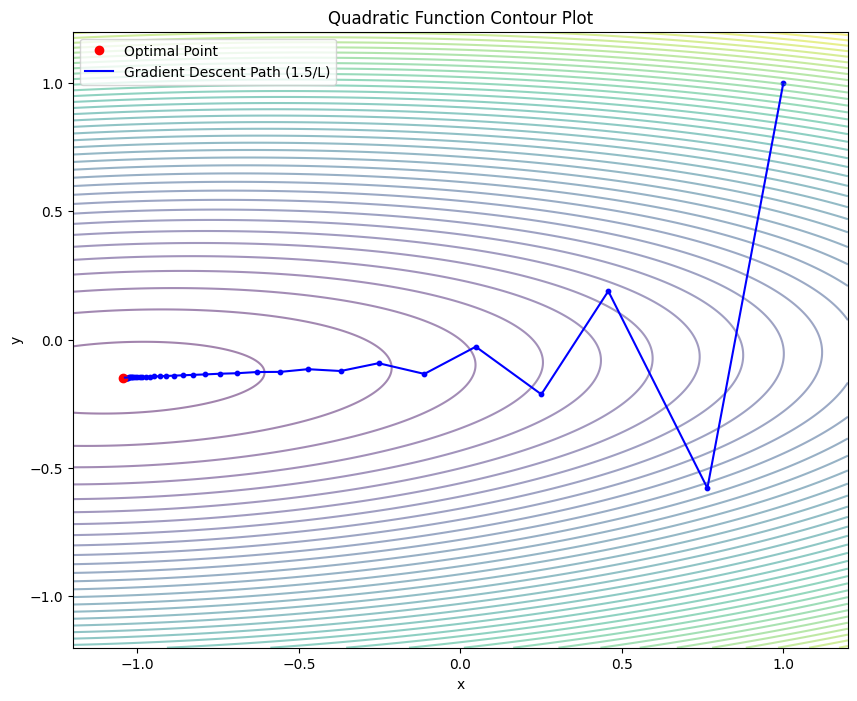

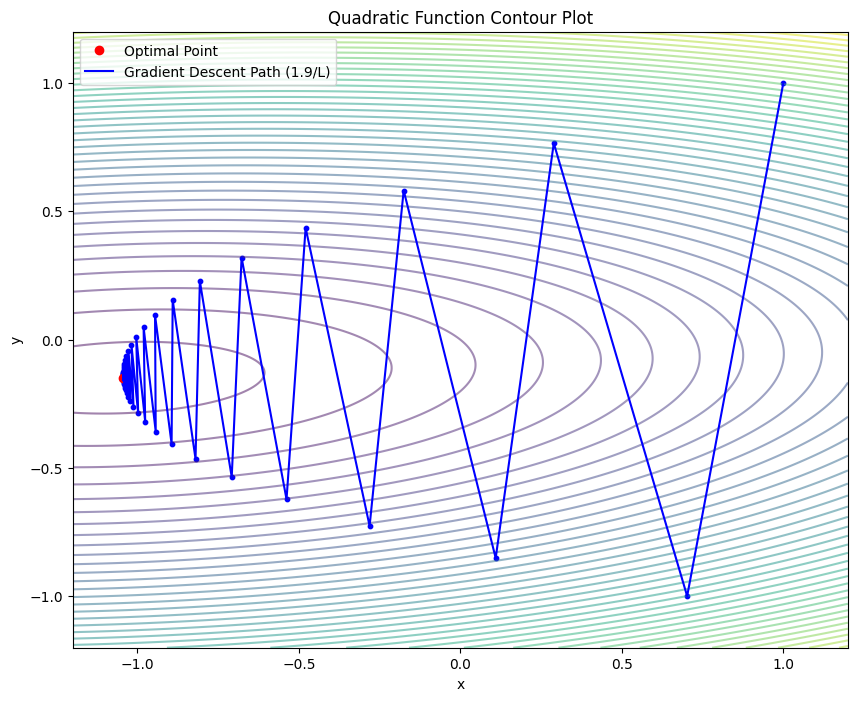

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
np.random.seed(4)
# Generate the quadratic function with a specific conditional number
A_10, quadratic_10 = Generate(10)
A_50, quadratic_50 = Generate(50)


# Compute the smallest and largest eigenvalues of A_10
eigenvalues_10 = np.linalg.eigvals(A_10)
smallest_eigenvalue_10 = np.min(eigenvalues_10)
largest_eigenvalue_10 = np.max(eigenvalues_10)

print("Smallest eigenvalue of A_10:", smallest_eigenvalue_10)
print("Largest eigenvalue of A_10:", largest_eigenvalue_10)

# Compute the constant of smoothness for A_10
L_10 = np.linalg.norm(A_10, 2)
print("Constante of smoothness for A_10:", L_10)


# Create a meshgrid for the contour plot
x = np.linspace(-1.2, 1.2, 400)
y = np.linspace(-1.2, 1.2, 400)
X, Y = np.meshgrid(x, y)

# Calculate Z values for both quadratic functions
Z_10 = np.array([quadratic_10(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)
Z_50 = np.array([quadratic_50(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)

# Perform the gradient descent for two stepsizes
alpha_small = Gradient_descent(A_10,np.min(Z_10)+1e-5, 50000, 1/L_10)
alpha_medium = Gradient_descent(A_10,np.min(Z_10)+1e-5, 50000, 1.5/L_10)
alpha_big = Gradient_descent(A_10,np.min(Z_10)+1e-5, 50000, 1.9/L_10) 

print('Number iteration for 1/L stepsize:',alpha_small.shape[0])
print('Number iteration for 1.5/L stepsize:',alpha_medium.shape[0])
print('Number iteration for 1.9/L stepsize:',alpha_big.shape[0])

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 10 with plain line
contour_10 = ax.contour(X, Y, Z_10, levels=100, cmap='viridis', alpha=0.5)
# Plot for conditional number 50 with dot line
#contour_50 = ax.contour(X, Y, Z_50, levels=50, cmap='plasma', alpha=0.5, linestyles='dotted')

# Add minimal points
min_point_10 = np.unravel_index(np.argmin(Z_10), Z_10.shape)
min_point_50 = np.unravel_index(np.argmin(Z_50), Z_50.shape)
ax.plot(X[min_point_10], Y[min_point_10], 'ro', label='Optimal Point')
#ax.plot(X[min_point_50], Y[min_point_50], 'bo', label='Min Point (Cond 50)')

# Add gradient descent and Chebyshev path
#ax.plot(alpha_big[:, 0], alpha_big[:, 1], 'b-', label='Gradient Descent Path (1.5/L)')
ax.plot(alpha_small[:, 0], alpha_small[:, 1], 'b-', label='Gradient Descent Path (1/L)')
ax.scatter(alpha_small[:, 0], alpha_small[:, 1], c='b', s=10)


# Add labels and legend
ax.set_title('Quadratic Function Contour Plot')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.legend()

plt.show()

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 10 with plain line
contour_10 = ax.contour(X, Y, Z_10, levels=50, cmap='viridis', alpha=0.5)
# Plot for conditional number 50 with dot line
#contour_50 = ax.contour(X, Y, Z_50, levels=50, cmap='plasma', alpha=0.5, linestyles='dotted')

# Add minimal points
min_point_10 = np.unravel_index(np.argmin(Z_10), Z_10.shape)
min_point_50 = np.unravel_index(np.argmin(Z_50), Z_50.shape)
ax.plot(X[min_point_10], Y[min_point_10], 'ro', label='Optimal Point')
#ax.plot(X[min_point_50], Y[min_point_50], 'bo', label='Min Point (Cond 50)')

# Add gradient descent and Chebyshev path
ax.plot(alpha_medium[:, 0], alpha_medium[:, 1], 'b-', label='Gradient Descent Path (1.5/L)')
ax.scatter(alpha_medium[:, 0], alpha_medium[:, 1], c='b', s=10)
#ax.plot(alpha_small[:, 0], alpha_small[:, 1], 'g-', label='Gradient Descent Path (1/L)')


# Add labels and legend
ax.set_title('Quadratic Function Contour Plot')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.legend()

plt.show()

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 10 with plain line
contour_10 = ax.contour(X, Y, Z_10, levels=50, cmap='viridis', alpha=0.5)
# Plot for conditional number 50 with dot line
#contour_50 = ax.contour(X, Y, Z_50, levels=50, cmap='plasma', alpha=0.5, linestyles='dotted')

# Add minimal points
min_point_10 = np.unravel_index(np.argmin(Z_10), Z_10.shape)
min_point_50 = np.unravel_index(np.argmin(Z_50), Z_50.shape)
ax.plot(X[min_point_10], Y[min_point_10], 'ro', label='Optimal Point')
#ax.plot(X[min_point_50], Y[min_point_50], 'bo', label='Min Point (Cond 50)')

# Add gradient descent and Chebyshev path
ax.plot(alpha_big[:, 0], alpha_big[:, 1], 'b-', label='Gradient Descent Path (1.9/L)')
ax.scatter(alpha_big[:, 0], alpha_big[:, 1], c='b', s=10)
#ax.plot(alpha_small[:, 0], alpha_small[:, 1], 'g-', label='Gradient Descent Path (1/L)')


# Add labels and legend
ax.set_title('Quadratic Function Contour Plot')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.legend()

plt.show()

# # Compute the value of Z_50 for the two alpha
# Z_50_alpha_small = quadratic_50(alpha_small[-1])
# Z_50_alpha_big = quadratic_50(alpha_big[-1])

# print('Z_50 values for alpha_small:', Z_50_alpha_small)
# print('Z_50 values for alpha_big:', Z_50_alpha_big)

Smallest eigenvalue of A_10: 1.0
Largest eigenvalue of A_10: 9.999999999999998
Constante of smoothness for A_10: 9.999999999999996
Number iteration for 1.99/L stepsize: 652
Number iteration for 2/L stepsize: 50000
Number iteration for 2.001/L stepsize: 50000


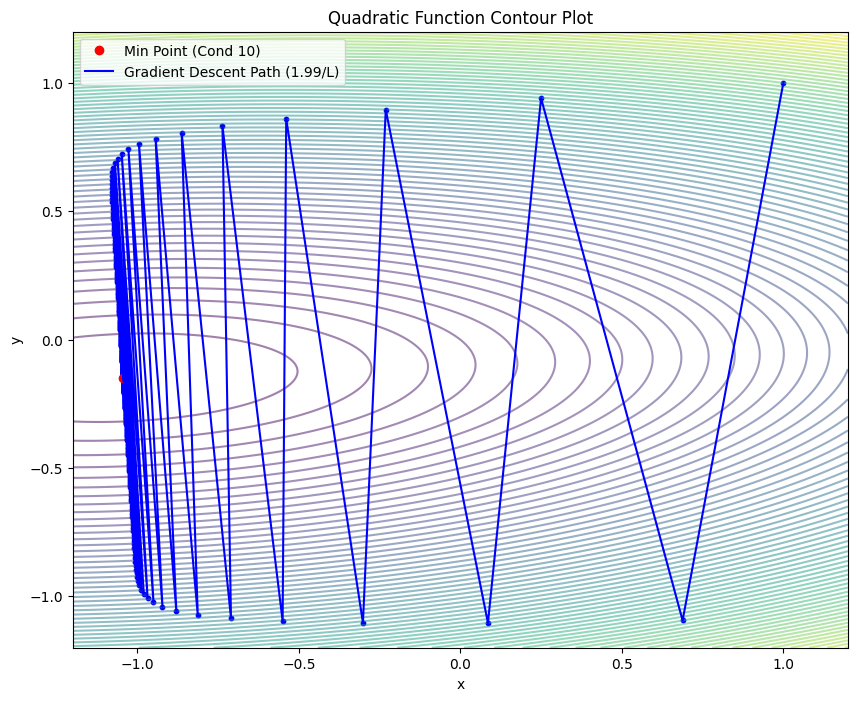

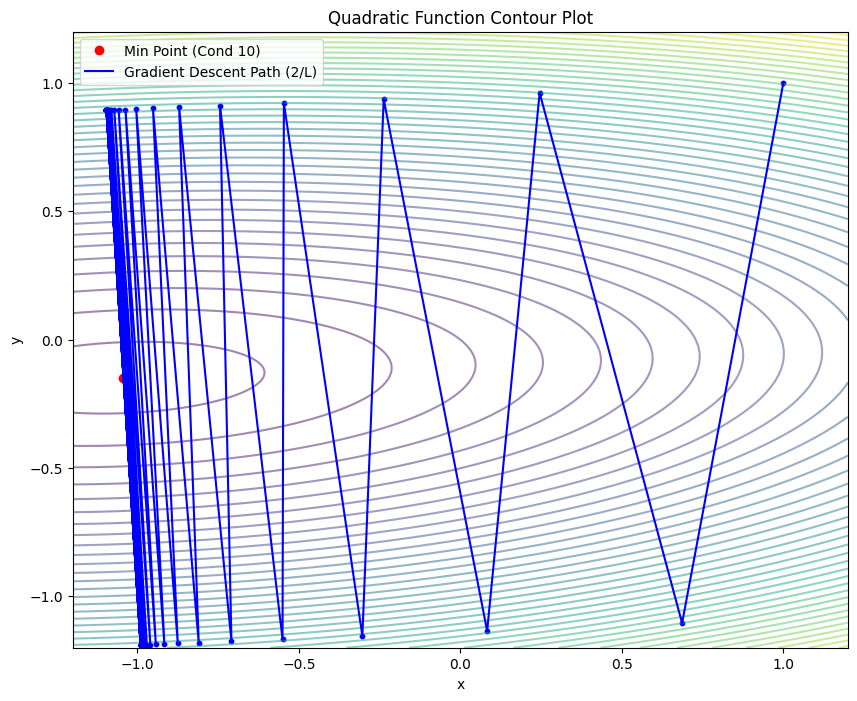

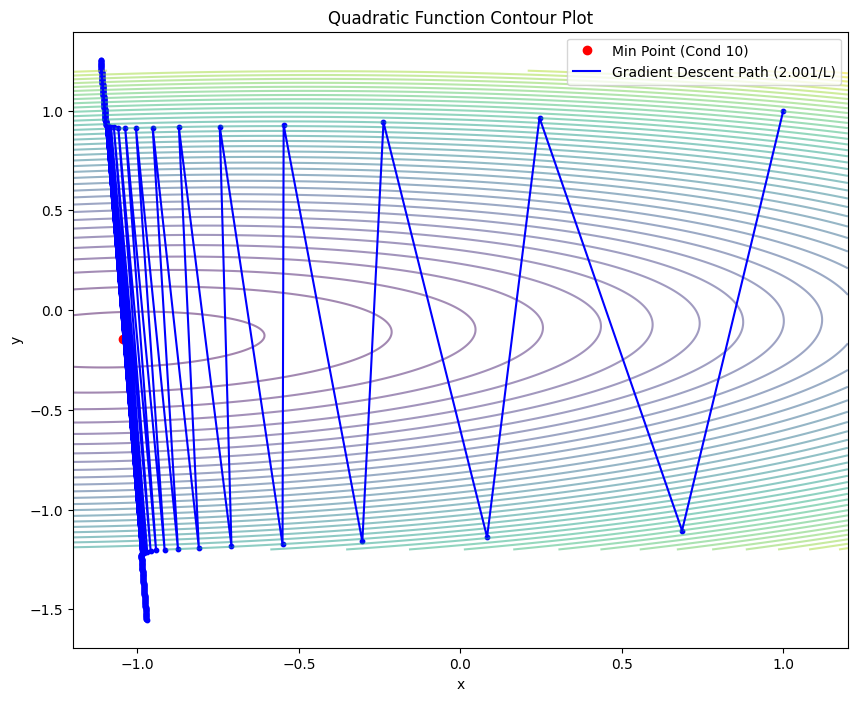

In [54]:
import matplotlib.pyplot as plt
import numpy as np
np.random.seed(4)
# Generate the quadratic function with a specific conditional number
A_10, quadratic_10 = Generate(10)
A_50, quadratic_50 = Generate(50)


# Compute the smallest and largest eigenvalues of A_10
eigenvalues_10 = np.linalg.eigvals(A_10)
smallest_eigenvalue_10 = np.min(eigenvalues_10)
largest_eigenvalue_10 = np.max(eigenvalues_10)

print("Smallest eigenvalue of A_10:", smallest_eigenvalue_10)
print("Largest eigenvalue of A_10:", largest_eigenvalue_10)

# Compute the constant of smoothness for A_10
L_10 = np.linalg.norm(A_10, 2)
print("Constante of smoothness for A_10:", L_10)


# Create a meshgrid for the contour plot
x = np.linspace(-1.2, 1.2, 400)
y = np.linspace(-1.2, 1.2, 400)
X, Y = np.meshgrid(x, y)

# Calculate Z values for both quadratic functions
Z_10 = np.array([quadratic_10(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)
Z_50 = np.array([quadratic_50(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)

# Perform the gradient descent for two stepsizes
alpha_small = Gradient_descent(A_10,np.min(Z_10)+1e-5, 50000, 1.99/L_10)
alpha_medium = Gradient_descent(A_10,np.min(Z_10)+1e-5, 50000, 2/L_10)
alpha_big = Gradient_descent(A_10,np.min(Z_10)+1e-5, 50000, 2.001/L_10) 

print('Number iteration for 1.99/L stepsize:',alpha_small.shape[0])
print('Number iteration for 2/L stepsize:',alpha_medium.shape[0])
print('Number iteration for 2.001/L stepsize:',alpha_big.shape[0])

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 10 with plain line
contour_10 = ax.contour(X, Y, Z_10, levels=100, cmap='viridis', alpha=0.5)
# Plot for conditional number 50 with dot line
#contour_50 = ax.contour(X, Y, Z_50, levels=50, cmap='plasma', alpha=0.5, linestyles='dotted')

# Add minimal points
min_point_10 = np.unravel_index(np.argmin(Z_10), Z_10.shape)
min_point_50 = np.unravel_index(np.argmin(Z_50), Z_50.shape)
ax.plot(X[min_point_10], Y[min_point_10], 'ro', label='Min Point (Cond 10)')
#ax.plot(X[min_point_50], Y[min_point_50], 'bo', label='Min Point (Cond 50)')

# Add gradient descent and Chebyshev path
#ax.plot(alpha_big[:, 0], alpha_big[:, 1], 'b-', label='Gradient Descent Path (1.5/L)')
ax.plot(alpha_small[:, 0], alpha_small[:, 1], 'b-', label='Gradient Descent Path (1.99/L)')
ax.scatter(alpha_small[:, 0], alpha_small[:, 1], c='b', s=10)


# Add labels and legend
ax.set_title('Quadratic Function Contour Plot')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.legend()

plt.show()

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 10 with plain line
contour_10 = ax.contour(X, Y, Z_10, levels=50, cmap='viridis', alpha=0.5)
# Plot for conditional number 50 with dot line
#contour_50 = ax.contour(X, Y, Z_50, levels=50, cmap='plasma', alpha=0.5, linestyles='dotted')

# Add minimal points
min_point_10 = np.unravel_index(np.argmin(Z_10), Z_10.shape)
min_point_50 = np.unravel_index(np.argmin(Z_50), Z_50.shape)
ax.plot(X[min_point_10], Y[min_point_10], 'ro', label='Min Point (Cond 10)')
#ax.plot(X[min_point_50], Y[min_point_50], 'bo', label='Min Point (Cond 50)')

# Add gradient descent and Chebyshev path
ax.plot(alpha_medium[:, 0], alpha_medium[:, 1], 'b-', label='Gradient Descent Path (2/L)')
ax.scatter(alpha_medium[:, 0], alpha_medium[:, 1], c='b', s=10)
#ax.plot(alpha_small[:, 0], alpha_small[:, 1], 'g-', label='Gradient Descent Path (1/L)')


# Add labels and legend
ax.set_title('Quadratic Function Contour Plot')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.legend()

plt.show()

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 10 with plain line
contour_10 = ax.contour(X, Y, Z_10, levels=50, cmap='viridis', alpha=0.5)
# Plot for conditional number 50 with dot line
#contour_50 = ax.contour(X, Y, Z_50, levels=50, cmap='plasma', alpha=0.5, linestyles='dotted')

# Add minimal points
min_point_10 = np.unravel_index(np.argmin(Z_10), Z_10.shape)
min_point_50 = np.unravel_index(np.argmin(Z_50), Z_50.shape)
ax.plot(X[min_point_10], Y[min_point_10], 'ro', label='Min Point (Cond 10)')
#ax.plot(X[min_point_50], Y[min_point_50], 'bo', label='Min Point (Cond 50)')

# Add gradient descent and Chebyshev path
ax.plot(alpha_big[:300, 0], alpha_big[:300, 1], 'b-', label='Gradient Descent Path (2.001/L)')
ax.scatter(alpha_big[:300, 0], alpha_big[:300, 1], c='b', s=10)
#ax.plot(alpha_small[:, 0], alpha_small[:, 1], 'g-', label='Gradient Descent Path (1/L)')


# Add labels and legend
ax.set_title('Quadratic Function Contour Plot')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.legend()

plt.show()

# # Compute the value of Z_50 for the two alpha
# Z_50_alpha_small = quadratic_50(alpha_small[-1])
# Z_50_alpha_big = quadratic_50(alpha_big[-1])

# print('Z_50 values for alpha_small:', Z_50_alpha_small)
# print('Z_50 values for alpha_big:', Z_50_alpha_big)

Smallest eigenvalue of A_10: 1.0
Largest eigenvalue of A_10: 9.999999999999998
Constante of smoothness for A_10: 9.999999999999996
Number iteration for 1/L stepsize: 59
Number iteration for 1.8/L stepsize: 33
Number iteration for Chebyshev: 13


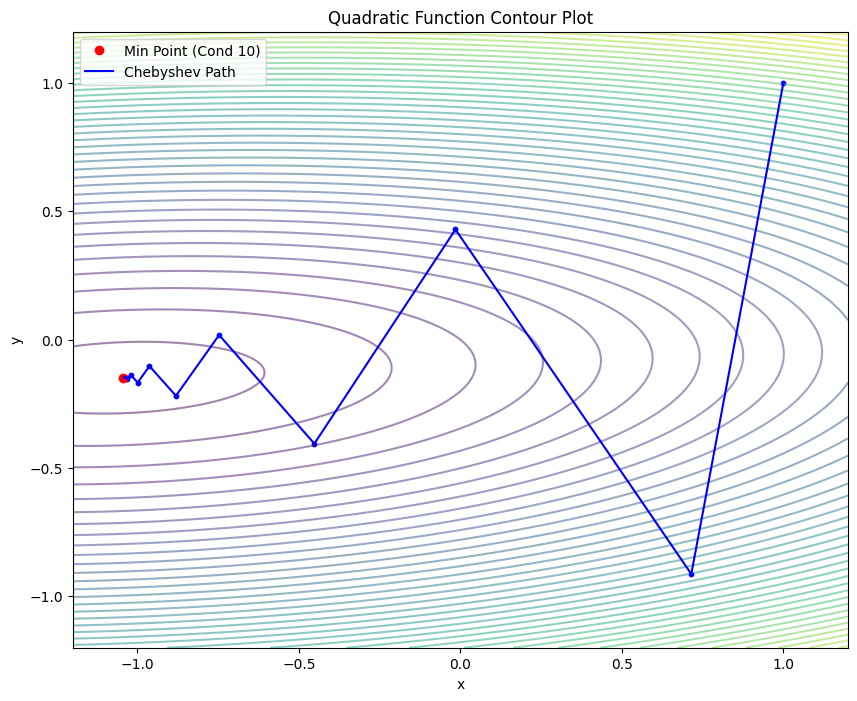

In [68]:
import matplotlib.pyplot as plt
import numpy as np
np.random.seed(4)
# Generate the quadratic function with a specific conditional number
A_10, quadratic_10 = Generate(10)
A_50, quadratic_50 = Generate(50)


# Compute the smallest and largest eigenvalues of A_10
eigenvalues_10 = np.linalg.eigvals(A_10)
smallest_eigenvalue_10 = np.min(eigenvalues_10)
largest_eigenvalue_10 = np.max(eigenvalues_10)

print("Smallest eigenvalue of A_10:", smallest_eigenvalue_10)
print("Largest eigenvalue of A_10:", largest_eigenvalue_10)

# Compute the constant of smoothness for A_10
L_10 = np.linalg.norm(A_10, 2)
print("Constante of smoothness for A_10:", L_10)


# Create a meshgrid for the contour plot
x = np.linspace(-1.2, 1.2, 400)
y = np.linspace(-1.2, 1.2, 400)
X, Y = np.meshgrid(x, y)

# Calculate Z values for both quadratic functions
Z_10 = np.array([quadratic_10(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)
Z_50 = np.array([quadratic_50(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)

# Perform the gradient descent for two stepsizes
alpha_small = Gradient_descent(A_10,np.min(Z_10)+1e-5, 50000, 1/L_10)
alpha_big = Gradient_descent(A_10,np.min(Z_10)+1e-5, 50000, 1.8/L_10) 
# Perform the Chebyshev method
alpha_not_chebyschev = Chebyshev(A_10,np.min(Z_10)+1e-5, 50000, largest_eigenvalue_10, smallest_eigenvalue_10)

print('Number iteration for 1/L stepsize:',alpha_small.shape[0])
print('Number iteration for 1.8/L stepsize:',alpha_big.shape[0])
print('Number iteration for Chebyshev:',alpha_not_chebyschev.shape[0])

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 10 with plain line
contour_10 = ax.contour(X, Y, Z_10, levels=50, cmap='viridis', alpha=0.5)
# Plot for conditional number 50 with dot line
#contour_50 = ax.contour(X, Y, Z_50, levels=50, cmap='plasma', alpha=0.5, linestyles='dotted')

# Add minimal points
min_point_10 = np.unravel_index(np.argmin(Z_10), Z_10.shape)
min_point_50 = np.unravel_index(np.argmin(Z_50), Z_50.shape)
ax.plot(X[min_point_10], Y[min_point_10], 'ro', label='Min Point (Cond 10)')
#ax.plot(X[min_point_50], Y[min_point_50], 'bo', label='Min Point (Cond 50)')

# Add gradient descent and Chebyshev path
#ax.plot(alpha_big[:, 0], alpha_big[:, 1], 'b-', label='Gradient Descent Path (1.8/L)')
#ax.plot(alpha_small[:, 0], alpha_small[:, 1], 'g-', label='Gradient Descent Path (1/L)')
ax.plot(alpha_not_chebyschev[:, 0], alpha_not_chebyschev[:, 1], 'b-', label='Chebyshev Path')
ax.scatter(alpha_not_chebyschev[:, 0], alpha_not_chebyschev[:, 1], c='b', s=10)

# Add labels and legend
ax.set_title('Quadratic Function Contour Plot')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.legend()

plt.show()

In [15]:
def chebychev_root(L,mu,t,i):
    w = L+ mu + (L-mu)*np.cos((i+1/2)*np.pi/(t))
    return w/2
def permutation(previous, T):
    change = [2 * T + 1 - p for p in previous]
    new= []
    for a in range(np.size(previous)):
        new.append(previous[a])
        new.append(change[a])
    return new
def perm(T):
    perm= [1]
    i = 1
    while i < T:
        perm = permutation(perm, i)
        i *= 2
    return perm

def fit_fractal_chebychev(A,loss_target,ite_max,L,mu,fractal=False):
    alpha_values= np.zeros((ite_max,2))
    alpha = np.ones(2)

    i=0
    alpha_values[i]=alpha

    roots = [chebychev_root(L, mu, ite_max-1, i) for i in range(ite_max)]

    permuted_roots = perm(ite_max-1)
    permuted_roots = [roots[i-1] for i in permuted_roots]
    
    print(roots)

    while 0.5*alpha.T@A@alpha + np.dot(alpha,np.array([1, 1])) > loss_target and i< ite_max-1:
        
        gradient = (A@alpha) + np.array([1,1])
        if fractal :
            alpha -= 1/permuted_roots[i] * gradient
        else:
            alpha -= 1/(roots[i]) * gradient

        i+=1
        alpha_values[i]=alpha

    return alpha_values[:i+1]

Smallest eigenvalue of A_10: 1.0
Largest eigenvalue of A_10: 9.999999999999998
Constante of smoothness for A_10: 9.999999999999996
[np.float64(9.975348529157227), np.float64(9.779754323328188), np.float64(9.397114317029972), np.float64(8.844151714648273), np.float64(8.145033635316128), np.float64(7.3303148938411), np.float64(6.435602608679916), np.float64(5.5), np.float64(4.564397391320083), np.float64(3.669685106158899), np.float64(2.854966364683871), np.float64(2.155848285351726), np.float64(1.6028856829700255), np.float64(1.2202456766718095), np.float64(1.0246514708427696), np.float64(1.0246514708427696)]
[np.float64(9.975348529157227), np.float64(9.779754323328188), np.float64(9.397114317029972), np.float64(8.844151714648273), np.float64(8.145033635316128), np.float64(7.3303148938411), np.float64(6.435602608679916), np.float64(5.5), np.float64(4.564397391320083), np.float64(3.669685106158899), np.float64(2.854966364683871), np.float64(2.155848285351726), np.float64(1.60288568297002

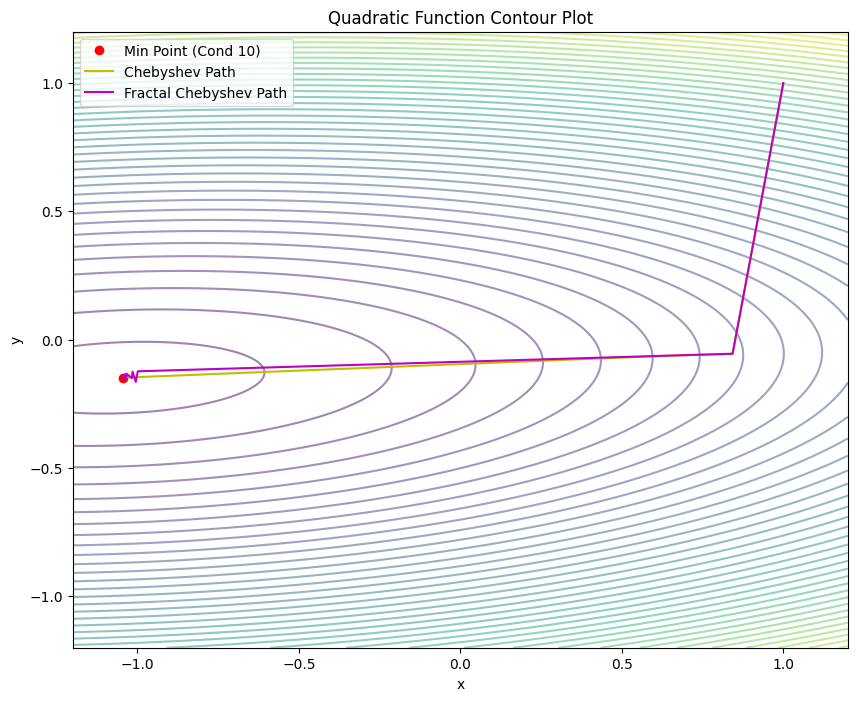

In [16]:
import matplotlib.pyplot as plt
import numpy as np
np.random.seed(4)
# Generate the quadratic function with a specific conditional number
A_10, quadratic_10 = Generate(10)
A_50, quadratic_50 = Generate(50)


# Compute the smallest and largest eigenvalues of A_10
eigenvalues_10 = np.linalg.eigvals(A_10)
smallest_eigenvalue_10 = np.min(eigenvalues_10)
largest_eigenvalue_10 = np.max(eigenvalues_10)

print("Smallest eigenvalue of A_10:", smallest_eigenvalue_10)
print("Largest eigenvalue of A_10:", largest_eigenvalue_10)

# Compute the constant of smoothness for A_10
L_10 = np.linalg.norm(A_10, 2)
print("Constante of smoothness for A_10:", L_10)


# Create a meshgrid for the contour plot
x = np.linspace(-1.2, 1.2, 400)
y = np.linspace(-1.2, 1.2, 400)
X, Y = np.meshgrid(x, y)

# Calculate Z values for both quadratic functions
Z_10 = np.array([quadratic_10(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)
Z_50 = np.array([quadratic_50(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)

# Perform the gradient descent for two stepsizes
alpha_small = Gradient_descent(A_10,np.min(Z_10)+1e-3, 50000, 1/L_10)
alpha_big = Gradient_descent(A_10,np.min(Z_10)+1e-3, 50000, 1.8/L_10) 
# Perform the Chebyshev method
alpha_chebyschev = fit_fractal_chebychev(A_10,np.min(Z_10), 16, largest_eigenvalue_10, smallest_eigenvalue_10)
alpha_fractal_chebyschev = fit_fractal_chebychev(A_10,np.min(Z_10), 16
                                                 , largest_eigenvalue_10, smallest_eigenvalue_10,fractal=True)

print('Number iteration for 1/L stepsize:',alpha_small.shape[0])
print('Number iteration for 1.8/L stepsize:',alpha_big.shape[0])
print('Number iteration for Chebyshev:',alpha_chebyschev.shape[0])
print('Number iteration for Fractal Chebyshev:',alpha_fractal_chebyschev.shape[0])

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 10 with plain line
contour_10 = ax.contour(X, Y, Z_10, levels=50, cmap='viridis', alpha=0.5)
# Plot for conditional number 50 with dot line
#contour_50 = ax.contour(X, Y, Z_50, levels=50, cmap='plasma', alpha=0.5, linestyles='dotted')

# Add minimal points
min_point_10 = np.unravel_index(np.argmin(Z_10), Z_10.shape)
min_point_50 = np.unravel_index(np.argmin(Z_50), Z_50.shape)
ax.plot(X[min_point_10], Y[min_point_10], 'ro', label='Min Point (Cond 10)')
#ax.plot(X[min_point_50], Y[min_point_50], 'bo', label='Min Point (Cond 50)')

# Add gradient descent and Chebyshev path
#ax.plot(alpha_big[:, 0], alpha_big[:, 1], 'b-', label='Gradient Descent Path (1.8/L)')
#ax.plot(alpha_small[:, 0], alpha_small[:, 1], 'g-', label='Gradient Descent Path (1/L)')
ax.plot(alpha_chebyschev[:, 0], alpha_chebyschev[:, 1], 'y-', label='Chebyshev Path')
ax.plot(alpha_fractal_chebyschev[:, 0], alpha_fractal_chebyschev[:, 1], 'm-', label='Fractal Chebyshev Path')

# Add labels and legend
ax.set_title('Quadratic Function Contour Plot')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.legend()

plt.show()

In [141]:
def fit_gradient(A,loss_target,ite_max,L):
  if ite_max == 3 : h=[1.5, 4.9,1.5]
  elif ite_max == 7 : h=[1.5, 2.2, 1.5, 12.0,1.5,2.2,1.5]
  elif ite_max == 15 : h=[1.4, 2.0, 1.4, 4.5, 1.4,2.0,1.4,29.7,
    1.4, 2.0, 1.4, 4.5,1.4,2.0,1.4]
  elif ite_max == 31 : h=[1.4, 2.0, 1.4, 3.9, 1.4,2.0,1.4,8.2,
    1.4, 2.0, 1.4, 3.9,1.4,2.0,1.4,72.3,
    1.4, 2.0, 1.4, 3.9,1.4,2.0,1.4,8.2,
    1.4, 2.0, 1.4, 3.9,1.4,2.0,1.4]
  elif ite_max == 63: h=[1.4, 2.0, 1.4, 3.9, 1.4,2.0,1.4,7.2,
    1.4, 2.0, 1.4, 3.9,1.4,2.0,1.4,14.2,
    1.4, 2.0, 1.4, 3.9,1.4,2.0,1.4,7.2,
    1.4, 2.0, 1.4, 3.9,1.4,2.0,1.4,164.0,
    1.4, 2.0, 1.4, 3.9,1.4,2.0,1.4,7.2,
    1.4, 2.0, 1.4, 3.9,1.4,2.0,1.4,14.2,
    1.4, 2.0, 1.4, 3.9,1.4,2.0,1.4,7.2,
    1.4, 2.0, 1.4, 3.9,1.4,2.0,1.4]
  else : pass 
  alpha_values= np.zeros((ite_max+1,2))
  alpha = np.ones(2)

  i=0
  alpha_values[i]=alpha


  while 0.5*alpha.T@A@alpha + np.dot(alpha,np.array([1, 1])) > loss_target and i< ite_max:
    
    gradient = (A@alpha) + np.array([1,1])
    alpha -=  h[i]/L* gradient

    i+=1
    alpha_values[i]=alpha
  
  return alpha_values[:i+1]

Smallest eigenvalue of A_10: 1.0
Largest eigenvalue of A_10: 9.999999999999998
Constante of smoothness for A_10: 9.999999999999996
Value of the function at the minimum: -0.5955735011175021
Value of the function for 1.8/L stepsize: -0.5955648688865887
Value of the function for Periodic stepsize: -0.5874205831056143
Number iteration for 1.8/L stepsize: 33
Number iteration for Periodic stepsize: 64


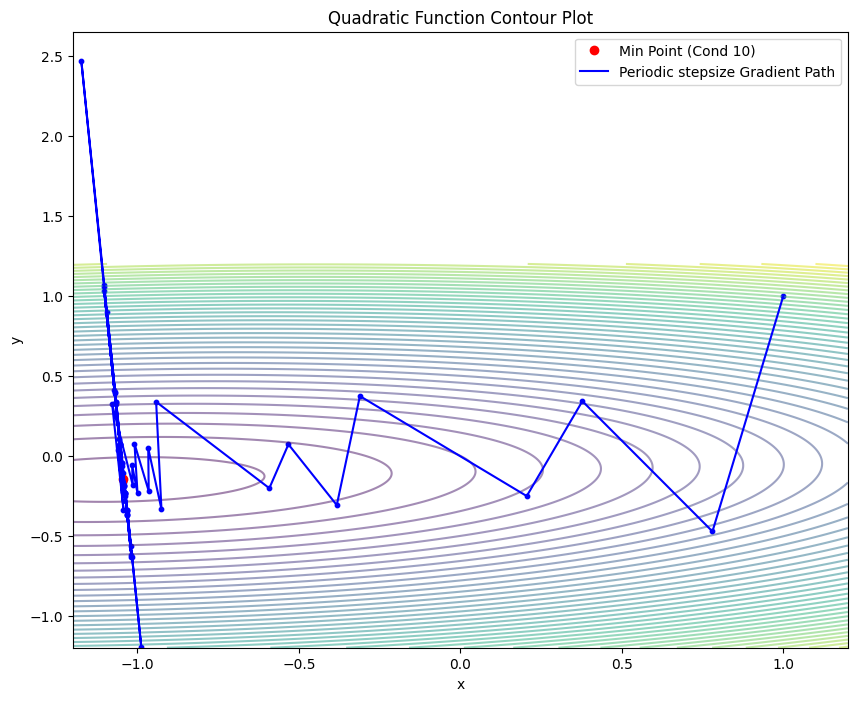

In [74]:
import matplotlib.pyplot as plt
import numpy as np
np.random.seed(4)
# Generate the quadratic function with a specific conditional number
A_10, quadratic_10 = Generate(10)
A_50, quadratic_50 = Generate(50)


# Compute the smallest and largest eigenvalues of A_10
eigenvalues_10 = np.linalg.eigvals(A_10)
smallest_eigenvalue_10 = np.min(eigenvalues_10)
largest_eigenvalue_10 = np.max(eigenvalues_10)

print("Smallest eigenvalue of A_10:", smallest_eigenvalue_10)
print("Largest eigenvalue of A_10:", largest_eigenvalue_10)

# Compute the constant of smoothness for A_10
L_10 = np.linalg.norm(A_10, 2)
print("Constante of smoothness for A_10:", L_10)


# Create a meshgrid for the contour plot
x = np.linspace(-1.2, 1.2, 400)
y = np.linspace(-1.2, 1.2, 400)
X, Y = np.meshgrid(x, y)

# Calculate Z values for both quadratic functions
Z_10 = np.array([quadratic_10(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)
Z_50 = np.array([quadratic_50(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)

# Perform the gradient descent for two stepsizes
alpha_small = Gradient_descent(A_10,np.min(Z_10)+1e-5, 50000, 1/L_10)
alpha_big = Gradient_descent(A_10,np.min(Z_10)+1e-5, 50000, 1.8/L_10) 
# Perform the Chebyshev method
alpha_fractal_gradient = fit_gradient(A_10,np.min(Z_10), 63, L_10)

print('Value of the function at the minimum:',np.min(Z_10))
print('Value of the function for 1.8/L stepsize:',0.5*alpha_big[-1].T@A_10@alpha_big[-1] + np.dot(alpha_big[-1],np.array([1, 1])))
print('Value of the function for Periodic stepsize:',0.5*alpha_fractal_gradient[-1].T@A_10@alpha_fractal_gradient[-1] + np.dot(alpha_fractal_gradient[-1],np.array([1, 1])))

print('Number iteration for 1.8/L stepsize:',alpha_big.shape[0])
print('Number iteration for Periodic stepsize:',alpha_fractal_gradient.shape[0])

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 10 with plain line
contour_10 = ax.contour(X, Y, Z_10, levels=50, cmap='viridis', alpha=0.5)
# Plot for conditional number 50 with dot line
#contour_50 = ax.contour(X, Y, Z_50, levels=50, cmap='plasma', alpha=0.5, linestyles='dotted')

# Add minimal points
min_point_10 = np.unravel_index(np.argmin(Z_10), Z_10.shape)
min_point_50 = np.unravel_index(np.argmin(Z_50), Z_50.shape)
ax.plot(X[min_point_10], Y[min_point_10], 'ro', label='Min Point (Cond 10)')
#ax.plot(X[min_point_50], Y[min_point_50], 'bo', label='Min Point (Cond 50)')

# Add gradient descent and Chebyshev path
#ax.plot(alpha_big[:, 0], alpha_big[:, 1], 'b-', label='Gradient Descent Path (1.8/L)')
#ax.plot(alpha_small[:, 0], alpha_small[:, 1], 'g-', label='Gradient Descent Path (1/L)')
ax.plot(alpha_fractal_gradient[:, 0], alpha_fractal_gradient[:, 1], 'b-', label='Periodic stepsize Gradient Path')
ax.scatter(alpha_fractal_gradient[:, 0], alpha_fractal_gradient[:, 1], c='b', s=10)

# Add labels and legend
ax.set_title('Quadratic Function Contour Plot')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.legend()

plt.show()

In [129]:
def fit_dynamic_stepsize(A,loss_target,ite_max,L):
  alpha_values= np.zeros((ite_max+1,2))
  alpha = np.ones(2)

  i=0
  alpha_values[i]=alpha

  t = np.sqrt(2)/L
  T=0

  while 0.5*alpha.T@A@alpha > loss_target and i< ite_max:
    
    gradient = (A@alpha) 
    alpha -=  t* gradient

    i+=1
    alpha_values[i]=alpha

    T+=t 
    t=(-L*T+np.sqrt((L*T)**2+8*(L*T+1)))/(2*L)
  
  return alpha_values[:i+1]

Smallest eigenvalue of A_10: 1.0
Largest eigenvalue of A_10: 9.999999999999998
Constante of smoothness for A_10: 9.999999999999996
Value of the function at the minimum: -0.5955735011175021
Value of the function for 1.8/L stepsize: -0.5955648688865887
Value of the function for dynamic stepsize: -0.5955635454137249
Number iteration for 1/L stepsize: 59
Number iteration for 1.8/L stepsize: 33
Number iteration for dynamic stepsize: 348


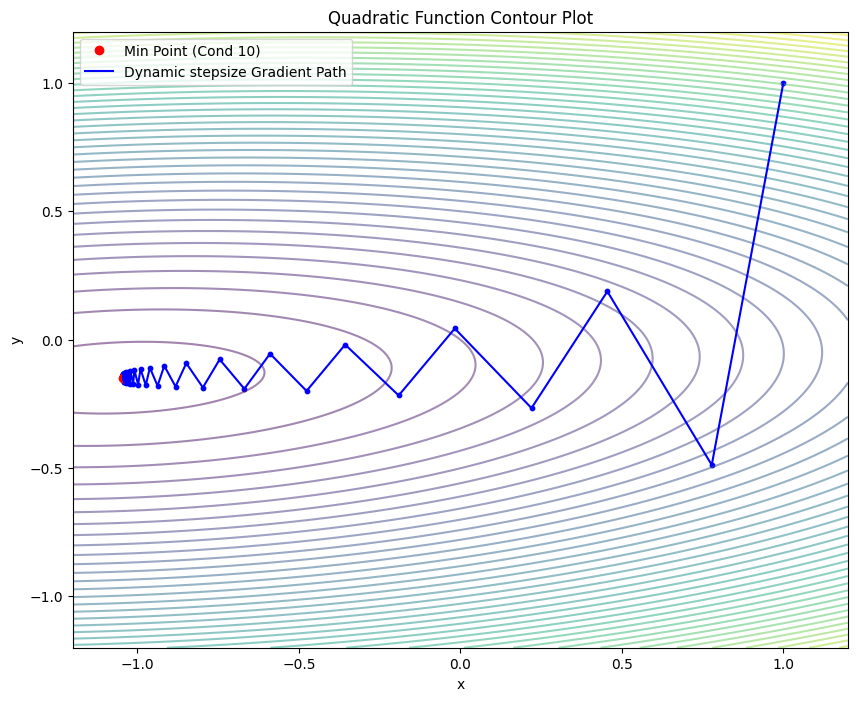

In [66]:
import matplotlib.pyplot as plt
import numpy as np
np.random.seed(4)
# Generate the quadratic function with a specific conditional number
A_10, quadratic_10 = Generate(10)
A_50, quadratic_50 = Generate(50)


# Compute the smallest and largest eigenvalues of A_10
eigenvalues_10 = np.linalg.eigvals(A_10)
smallest_eigenvalue_10 = np.min(eigenvalues_10)
largest_eigenvalue_10 = np.max(eigenvalues_10)

print("Smallest eigenvalue of A_10:", smallest_eigenvalue_10)
print("Largest eigenvalue of A_10:", largest_eigenvalue_10)

# Compute the constant of smoothness for A_10
L_10 = np.linalg.norm(A_10, 2)
print("Constante of smoothness for A_10:", L_10)


# Create a meshgrid for the contour plot
x = np.linspace(-1.2, 1.2, 400)
y = np.linspace(-1.2, 1.2, 400)
X, Y = np.meshgrid(x, y)

# Calculate Z values for both quadratic functions
Z_10 = np.array([quadratic_10(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)
Z_50 = np.array([quadratic_50(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)

# Perform the gradient descent for two stepsizes
alpha_small = Gradient_descent(A_10,np.min(Z_10)+1e-5, 50000, 1/L_10)
alpha_big = Gradient_descent(A_10,np.min(Z_10)+1e-5, 50000, 1.8/L_10) 
# Perform
alpha = fit_dynamic_stepsize(A_10,np.min(Z_10)+1e-5, 50000, L_10)

print('Value of the function at the minimum:',np.min(Z_10))
print('Value of the function for 1.8/L stepsize:',0.5*alpha_big[-1].T@A_10@alpha_big[-1] + np.dot(alpha_big[-1],np.array([1, 1])))
print('Value of the function for dynamic stepsize:',0.5*alpha[-1].T@A_10@alpha[-1] + np.dot(alpha[-1],np.array([1, 1])))
print('Number iteration for 1/L stepsize:',alpha_small.shape[0])
print('Number iteration for 1.8/L stepsize:',alpha_big.shape[0])
print('Number iteration for dynamic stepsize:', alpha.shape[0])

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 10 with plain line
contour_10 = ax.contour(X, Y, Z_10, levels=50, cmap='viridis', alpha=0.5)
# Plot for conditional number 50 with dot line
#contour_50 = ax.contour(X, Y, Z_50, levels=50, cmap='plasma', alpha=0.5, linestyles='dotted')

# Add minimal points
min_point_10 = np.unravel_index(np.argmin(Z_10), Z_10.shape)
min_point_50 = np.unravel_index(np.argmin(Z_50), Z_50.shape)
ax.plot(X[min_point_10], Y[min_point_10], 'ro', label='Min Point (Cond 10)')
#ax.plot(X[min_point_50], Y[min_point_50], 'bo', label='Min Point (Cond 50)')

# Add gradient descent and Chebyshev path
#ax.plot(alpha_big[:, 0], alpha_big[:, 1], 'b-', label='Gradient Descent Path (1.8/L)')
#ax.plot(alpha_small[:, 0], alpha_small[:, 1], 'g-', label='Gradient Descent Path (1/L)')
#ax.plot(alpha_chebyschev[:, 0], alpha_chebyschev[:, 1], 'y-', label='Chebyshev Path')
#ax.plot(alpha_fractal_chebyschev[:, 0], alpha_fractal_chebyschev[:, 1], 'm-', label='Fractal Chebyshev Path')
ax.plot(alpha[:, 0], alpha[:, 1], 'b-', label='Dynamic stepsize Gradient Path')
ax.scatter(alpha[:, 0], alpha[:, 1], c='b', s=10)

# Add labels and legend
ax.set_title('Quadratic Function Contour Plot')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.legend()

plt.show()

In [131]:
def fit_optimal_stepsize(A,loss_target,ite_max,L):
  alpha_values= np.zeros((ite_max+1,2))
  alpha = np.ones(2)

  i=0
  alpha_values[i]=alpha

  while 0.5*alpha.T@A@alpha  > loss_target and i< ite_max:
    
    gradient = (A@alpha)

    learning_rate = (gradient.T @ gradient) / (gradient.T @ A @ gradient)
    alpha -=  learning_rate* gradient

    i+=1
    alpha_values[i]=alpha
  
  return alpha_values[:i+1]

def fit_exact_stepsize(A,loss_target,ite_max,L):
  alpha_values= np.zeros((ite_max+1,2))
  alpha = np.ones(2)

  i=0
  alpha_values[i]=alpha

  while 0.5*alpha.T@A@alpha > loss_target and i< ite_max:
    
    gradient = (A@alpha)

    learning_rate = (gradient.T@A.T @ gradient) / (gradient.T @A.T@ A @ gradient)
    alpha -=  learning_rate* gradient

    i+=1
    alpha_values[i]=alpha
  
  return alpha_values[:i+1]



Smallest eigenvalue of A_10: 1.0
Largest eigenvalue of A_10: 9.999999999999998
Constante of smoothness for A_10: 9.999999999999996
Value of the function at the minimum: -0.5955735011175021
Value of the function for 1.8/L stepsize: -0.5955648688865887
Value of the function for optimal stepsize: -0.5955741734422756
Number iteration for 1/L stepsize: 59
Number iteration for 1.8/L stepsize: 33
Number iteration for optimal stepsize: 12


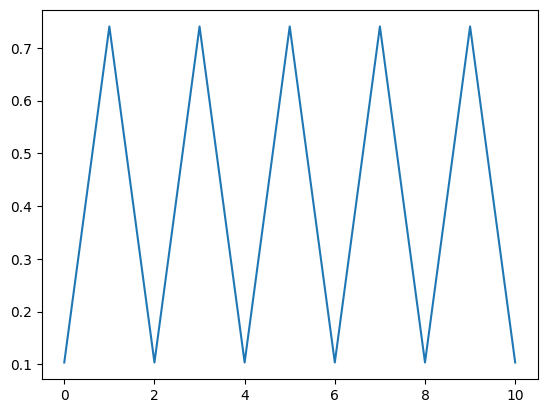

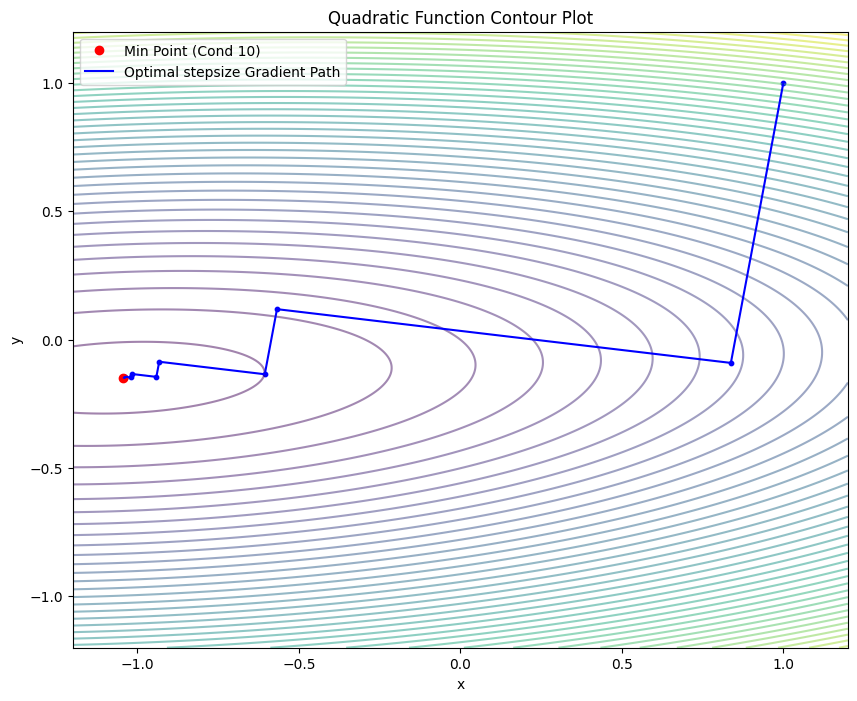

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
np.random.seed(4)
# Generate the quadratic function with a specific conditional number
A_10, quadratic_10 = Generate(10)
A_50, quadratic_50 = Generate(50)


# Compute the smallest and largest eigenvalues of A_10
eigenvalues_10 = np.linalg.eigvals(A_10)
smallest_eigenvalue_10 = np.min(eigenvalues_10)
largest_eigenvalue_10 = np.max(eigenvalues_10)

print("Smallest eigenvalue of A_10:", smallest_eigenvalue_10)
print("Largest eigenvalue of A_10:", largest_eigenvalue_10)

# Compute the constant of smoothness for A_10
L_10 = np.linalg.norm(A_10, 2)
print("Constante of smoothness for A_10:", L_10)


# Create a meshgrid for the contour plot
x = np.linspace(-1.2, 1.2, 400)
y = np.linspace(-1.2, 1.2, 400)
X, Y = np.meshgrid(x, y)

# Calculate Z values for both quadratic functions
Z_10 = np.array([quadratic_10(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)
Z_50 = np.array([quadratic_50(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)

# Perform the gradient descent for two stepsizes
alpha_small = Gradient_descent(A_10,np.min(Z_10)+1e-5, 50000, 1/L_10)
alpha_big = Gradient_descent(A_10,np.min(Z_10)+1e-5, 50000, 1.8/L_10) 
# Perform
alpha = fit_optimal_stepsize(A_10,np.min(Z_10)+1e-5, 50000, L_10)

print('Value of the function at the minimum:',np.min(Z_10))
print('Value of the function for 1.8/L stepsize:',0.5*alpha_big[-1].T@A_10@alpha_big[-1] + np.dot(alpha_big[-1],np.array([1, 1])))
print('Value of the function for optimal stepsize:',0.5*alpha[-1].T@A_10@alpha[-1] + np.dot(alpha[-1],np.array([1, 1])))
print('Number iteration for 1/L stepsize:',alpha_small.shape[0])
print('Number iteration for 1.8/L stepsize:',alpha_big.shape[0])
print('Number iteration for optimal stepsize:', alpha.shape[0])

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 10 with plain line
contour_10 = ax.contour(X, Y, Z_10, levels=50, cmap='viridis', alpha=0.5)
# Plot for conditional number 50 with dot line
#contour_50 = ax.contour(X, Y, Z_50, levels=50, cmap='plasma', alpha=0.5, linestyles='dotted')

# Add minimal points
min_point_10 = np.unravel_index(np.argmin(Z_10), Z_10.shape)
min_point_50 = np.unravel_index(np.argmin(Z_50), Z_50.shape)
ax.plot(X[min_point_10], Y[min_point_10], 'ro', label='Min Point (Cond 10)')
#ax.plot(X[min_point_50], Y[min_point_50], 'bo', label='Min Point (Cond 50)')

# Add gradient descent and Chebyshev path
#ax.plot(alpha_big[:, 0], alpha_big[:, 1], 'b-', label='Gradient Descent Path (1.8/L)')
#ax.plot(alpha_small[:, 0], alpha_small[:, 1], 'g-', label='Gradient Descent Path (1/L)')
#ax.plot(alpha_chebyschev[:, 0], alpha_chebyschev[:, 1], 'y-', label='Chebyshev Path')
#ax.plot(alpha_fractal_chebyschev[:, 0], alpha_fractal_chebyschev[:, 1], 'm-', label='Fractal Chebyshev Path')
ax.plot(alpha[:, 0], alpha[:, 1], 'b-', label='Optimal stepsize Gradient Path')
ax.scatter(alpha[:, 0], alpha[:, 1], c='b', s=10)

# Add labels and legend
ax.set_title('Quadratic Function Contour Plot')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.legend()

plt.show()

Smallest eigenvalue of A_10: 1.0
Largest eigenvalue of A_10: 9.999999999999998
Constante of smoothness for A_10: 9.999999999999996
Value of the function at the minimum: -0.5955735011175021
Value of the function for 1.8/L stepsize: -0.5955648688865887
Value of the function for exact stepsize: -0.595567453805363
Number iteration for 1/L stepsize: 59
Number iteration for 1.8/L stepsize: 33
Number iteration for exact stepsize: 5


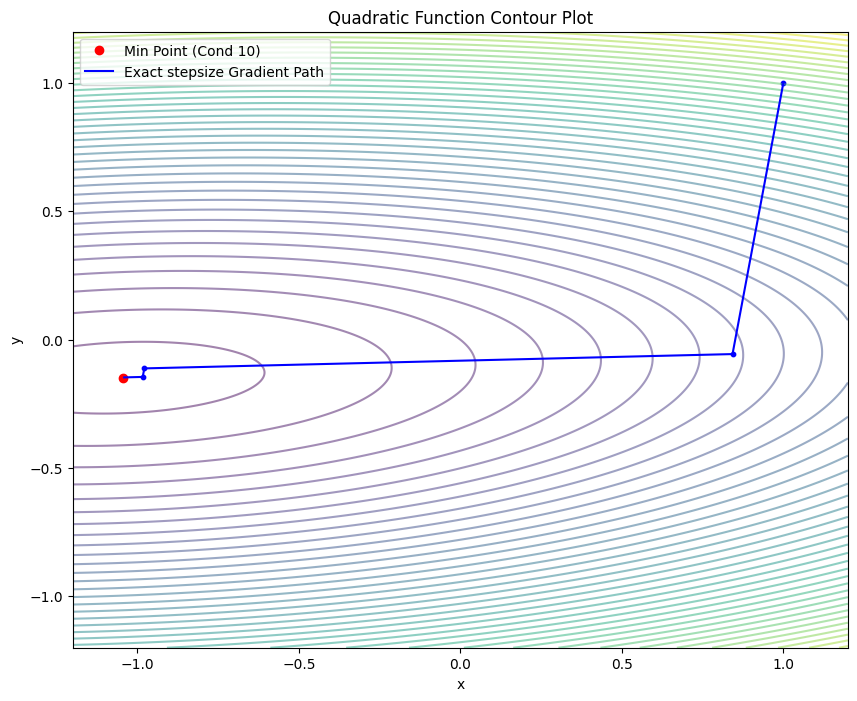

In [64]:
import matplotlib.pyplot as plt
import numpy as np
np.random.seed(4)
# Generate the quadratic function with a specific conditional number
A_10, quadratic_10 = Generate(10)
A_50, quadratic_50 = Generate(50)


# Compute the smallest and largest eigenvalues of A_10
eigenvalues_10 = np.linalg.eigvals(A_10)
smallest_eigenvalue_10 = np.min(eigenvalues_10)
largest_eigenvalue_10 = np.max(eigenvalues_10)

print("Smallest eigenvalue of A_10:", smallest_eigenvalue_10)
print("Largest eigenvalue of A_10:", largest_eigenvalue_10)

# Compute the constant of smoothness for A_10
L_10 = np.linalg.norm(A_10, 2)
print("Constante of smoothness for A_10:", L_10)


# Create a meshgrid for the contour plot
x = np.linspace(-1.2, 1.2, 400)
y = np.linspace(-1.2, 1.2, 400)
X, Y = np.meshgrid(x, y)

# Calculate Z values for both quadratic functions
Z_10 = np.array([quadratic_10(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)
Z_50 = np.array([quadratic_50(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)

# Perform the gradient descent for two stepsizes
alpha_small = Gradient_descent(A_10,np.min(Z_10)+1e-5, 50000, 1/L_10)
alpha_big = Gradient_descent(A_10,np.min(Z_10)+1e-5, 50000, 1.8/L_10) 
# Perform
alpha = fit_exact_stepsize(A_10,np.min(Z_10)+1e-5, 50000, L_10)

print('Value of the function at the minimum:',np.min(Z_10))
print('Value of the function for 1.8/L stepsize:',0.5*alpha_big[-1].T@A_10@alpha_big[-1] + np.dot(alpha_big[-1],np.array([1, 1])))
print('Value of the function for exact stepsize:',0.5*alpha[-1].T@A_10@alpha[-1] + np.dot(alpha[-1],np.array([1, 1])))
print('Number iteration for 1/L stepsize:',alpha_small.shape[0])
print('Number iteration for 1.8/L stepsize:',alpha_big.shape[0])
print('Number iteration for exact stepsize:', alpha.shape[0])

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 10 with plain line
contour_10 = ax.contour(X, Y, Z_10, levels=50, cmap='viridis', alpha=0.5)
# Plot for conditional number 50 with dot line
#contour_50 = ax.contour(X, Y, Z_50, levels=50, cmap='plasma', alpha=0.5, linestyles='dotted')

# Add minimal points
min_point_10 = np.unravel_index(np.argmin(Z_10), Z_10.shape)
min_point_50 = np.unravel_index(np.argmin(Z_50), Z_50.shape)
ax.plot(X[min_point_10], Y[min_point_10], 'ro', label='Min Point (Cond 10)')
#ax.plot(X[min_point_50], Y[min_point_50], 'bo', label='Min Point (Cond 50)')

# Add gradient descent and Chebyshev path
#ax.plot(alpha_big[:, 0], alpha_big[:, 1], 'b-', label='Gradient Descent Path (1.8/L)')
#ax.plot(alpha_small[:, 0], alpha_small[:, 1], 'g-', label='Gradient Descent Path (1/L)')
#ax.plot(alpha_chebyschev[:, 0], alpha_chebyschev[:, 1], 'y-', label='Chebyshev Path')
#ax.plot(alpha_fractal_chebyschev[:, 0], alpha_fractal_chebyschev[:, 1], 'm-', label='Fractal Chebyshev Path')
ax.plot(alpha[:, 0], alpha[:, 1], 'b-', label='Exact stepsize Gradient Path')
ax.scatter(alpha[:, 0], alpha[:, 1], c='b', s=10)

# Add labels and legend
ax.set_title('Quadratic Function Contour Plot')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.legend()

plt.show()

Smallest eigenvalue of A_10: 1.0
Largest eigenvalue of A_10: 9.999999999999998
Constante of smoothness for A_10: 9.999999999999996
Value of the function at the minimum: -0.5955735011175021
Value of the function for optimal stepsize: -0.5955714579781037
Value of the function for exact stepsize: -0.595567453805363
Number iteration for optimal stepsize: 11
Number iteration for exact stepsize: 5


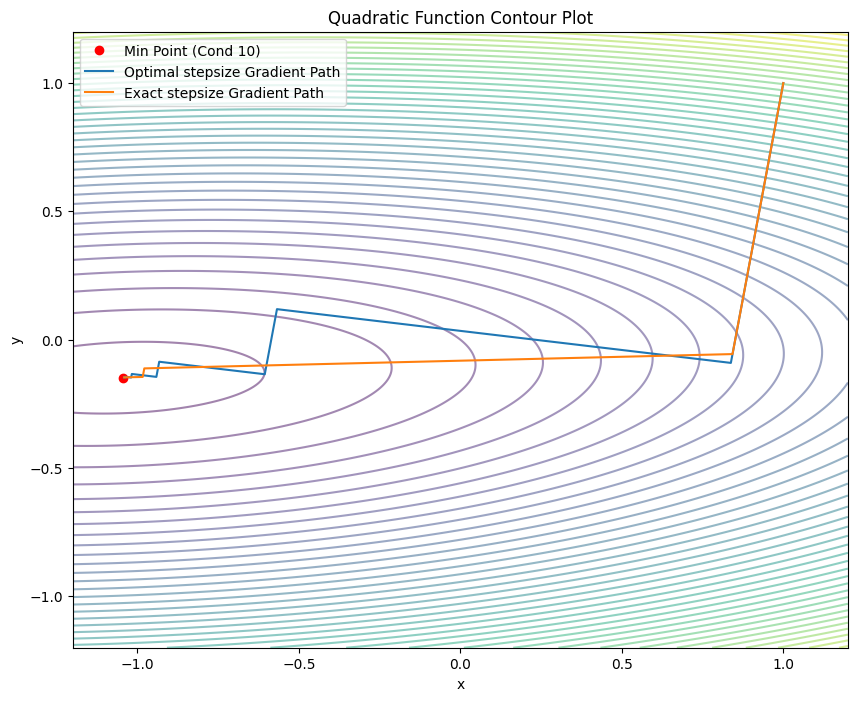

In [30]:
import matplotlib.pyplot as plt
import numpy as np
np.random.seed(4)
# Generate the quadratic function with a specific conditional number
A_10, quadratic_10 = Generate(10)
A_50, quadratic_50 = Generate(50)


# Compute the smallest and largest eigenvalues of A_10
eigenvalues_10 = np.linalg.eigvals(A_10)
smallest_eigenvalue_10 = np.min(eigenvalues_10)
largest_eigenvalue_10 = np.max(eigenvalues_10)

print("Smallest eigenvalue of A_10:", smallest_eigenvalue_10)
print("Largest eigenvalue of A_10:", largest_eigenvalue_10)

# Compute the constant of smoothness for A_10
L_10 = np.linalg.norm(A_10, 2)
print("Constante of smoothness for A_10:", L_10)


# Create a meshgrid for the contour plot
x = np.linspace(-1.2, 1.2, 400)
y = np.linspace(-1.2, 1.2, 400)
X, Y = np.meshgrid(x, y)

# Calculate Z values for both quadratic functions
Z_10 = np.array([quadratic_10(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)
Z_50 = np.array([quadratic_50(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)

# Perform the gradient descent for two stepsizes
# Perform
alpha = fit_optimal_stepsize(A_10,np.min(Z_10)+1e-5, 50000, L_10)
alpha_exact = fit_exact_stepsize(A_10,np.min(Z_10)+1e-5, 50000, L_10)

print('Value of the function at the minimum:',np.min(Z_10))
print('Value of the function for optimal stepsize:',0.5*alpha[-1].T@A_10@alpha[-1] + np.dot(alpha[-1],np.array([1, 1])))
print('Value of the function for exact stepsize:',0.5*alpha_exact[-1].T@A_10@alpha_exact[-1] + np.dot(alpha_exact[-1],np.array([1, 1])))
print('Number iteration for optimal stepsize:', alpha.shape[0])
print('Number iteration for exact stepsize:', alpha_exact.shape[0])

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 10 with plain line
contour_10 = ax.contour(X, Y, Z_10, levels=50, cmap='viridis', alpha=0.5)
# Plot for conditional number 50 with dot line
#contour_50 = ax.contour(X, Y, Z_50, levels=50, cmap='plasma', alpha=0.5, linestyles='dotted')

# Add minimal points
min_point_10 = np.unravel_index(np.argmin(Z_10), Z_10.shape)
min_point_50 = np.unravel_index(np.argmin(Z_50), Z_50.shape)
ax.plot(X[min_point_10], Y[min_point_10], 'ro', label='Min Point (Cond 10)')
#ax.plot(X[min_point_50], Y[min_point_50], 'bo', label='Min Point (Cond 50)')

# Add gradient descent and Chebyshev path
ax.plot(alpha[:, 0], alpha[:, 1], label='Optimal stepsize Gradient Path')
ax.plot(alpha_exact[:, 0], alpha_exact[:, 1], label='Exact stepsize Gradient Path')

# Add labels and legend
ax.set_title('Quadratic Function Contour Plot')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.legend()

plt.show()

Smallest eigenvalue of A_10: 0.9999999999999964
Largest eigenvalue of A_10: 100.0
Constante of smoothness for A_10: 100.00000000000001
Value of the function at the minimum: 0.07507689284612029
Value of the function for 1/L stepsize: 0.07425974871698723
Value of the function for 1.9/L stepsize: 0.06594678681437752
Value of the function for optimal stepsize: 0.07425974262925837
Value of the function for exact stepsize: 0.07425974859584143
Value of the function for dynamic stepsize: 0.07480255483709554
Value of the function for periodic stepsize: 0.061995393839997776
Number iteration for 1/L stepsize: 2
Number iteration for 1.9/L stepsize: 37
Number iteration for optimal stepsize: 2
Number iteration for exact stepsize: 2
Number iteration for dynamic stepsize: 25
Number iteration for periodic stepsize: 32


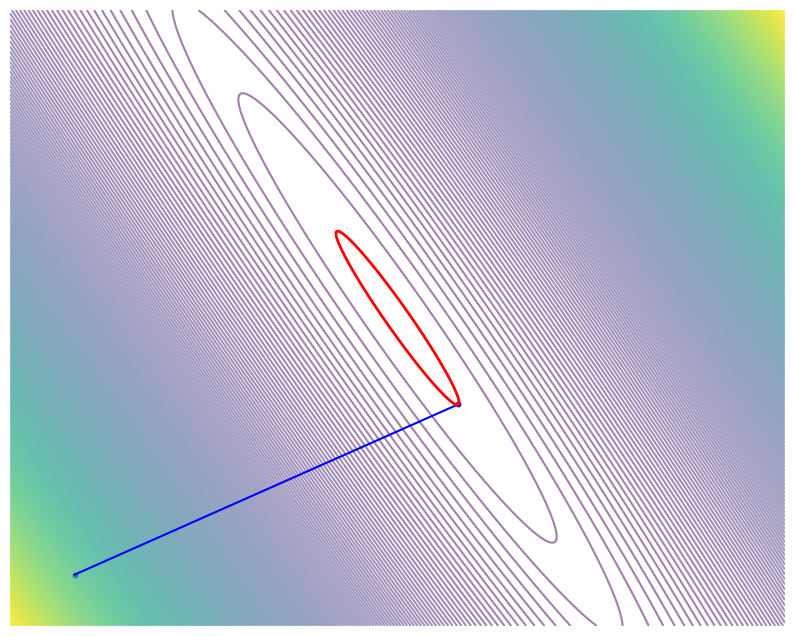

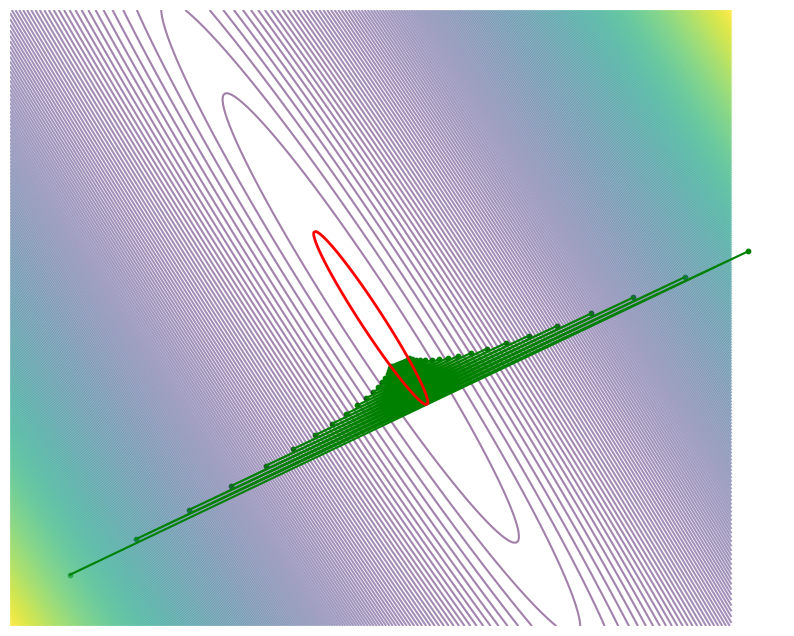

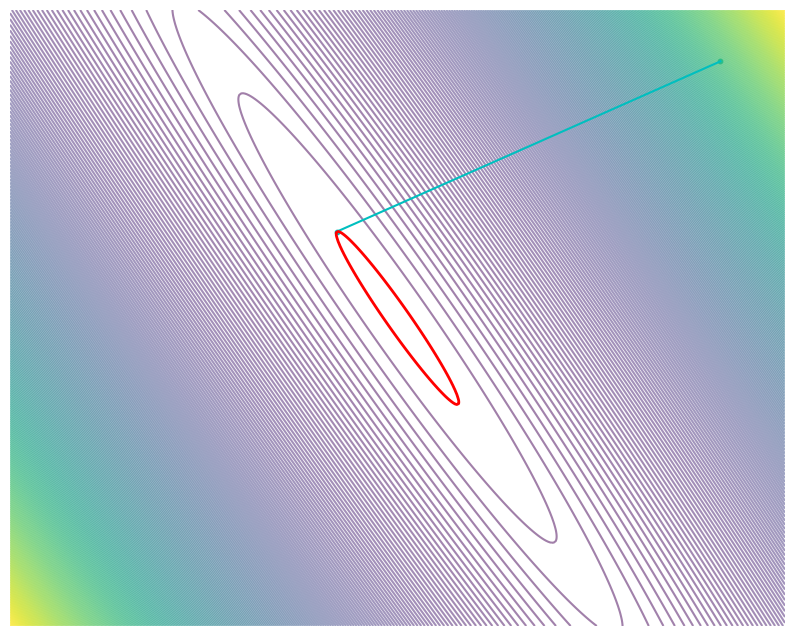

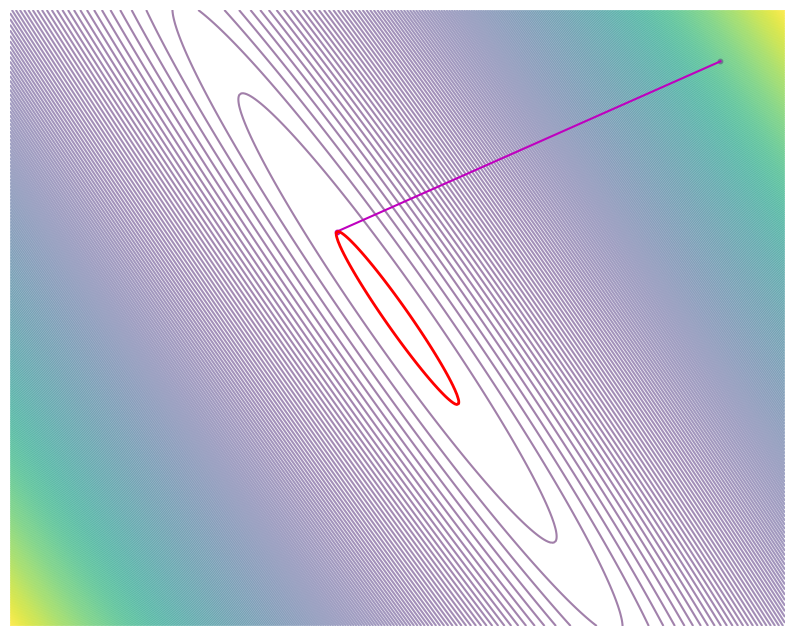

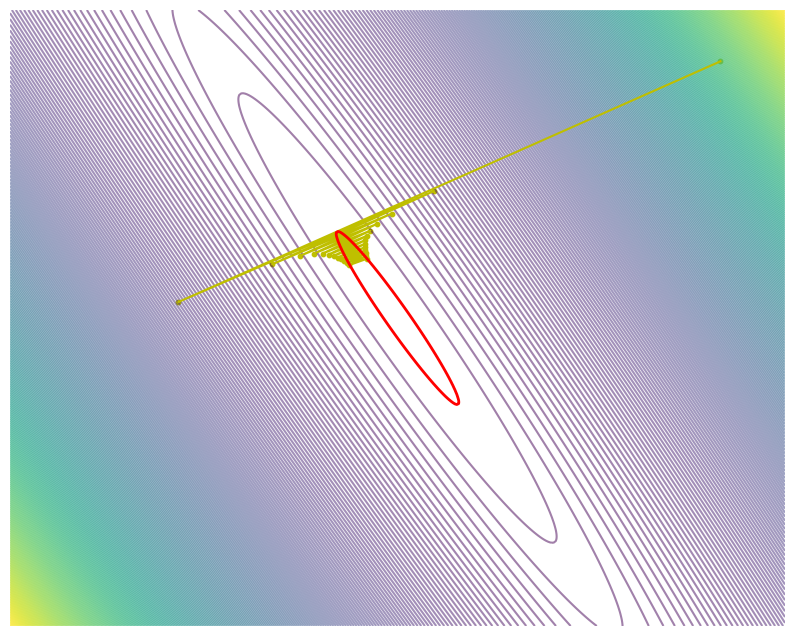

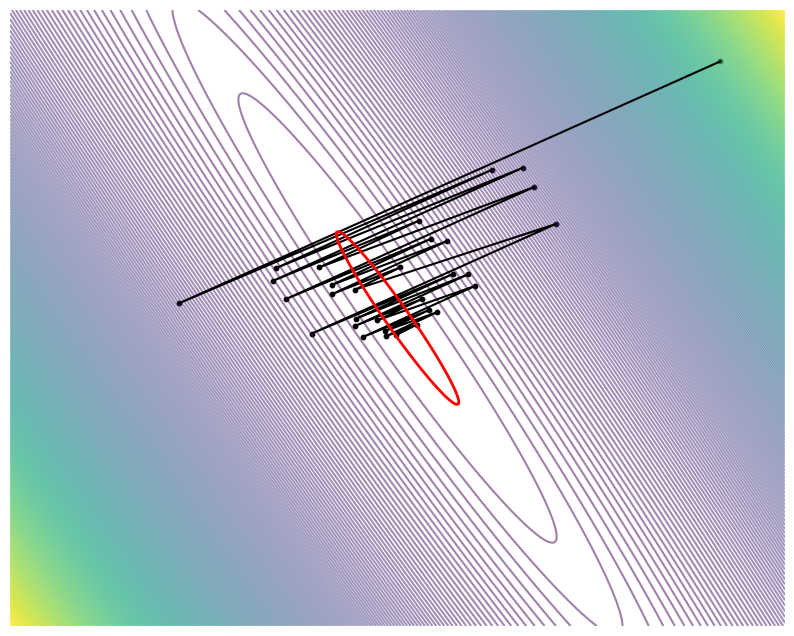

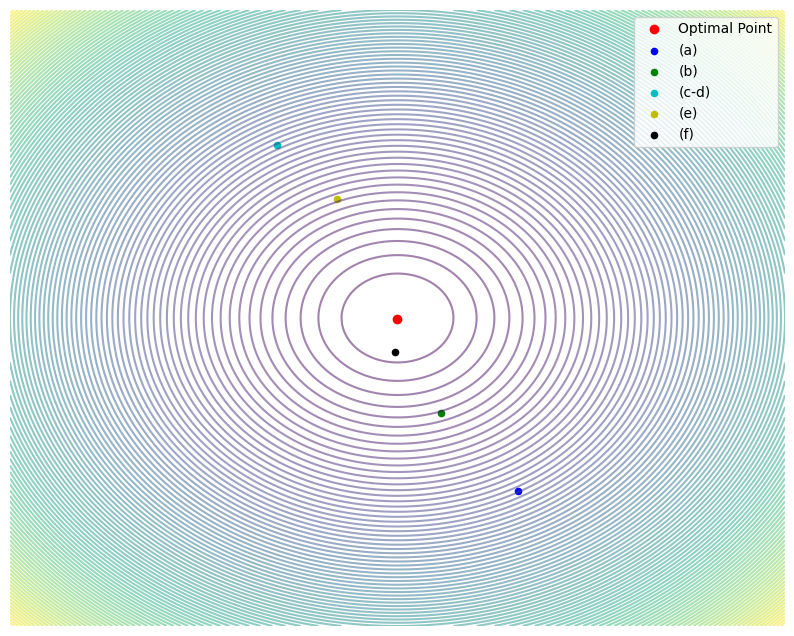

In [147]:
import matplotlib.pyplot as plt
import numpy as np
np.random.seed(0)
# Generate the quadratic function with a specific conditional number
A_10, quadratic_10 = Generate(100)
A_50, quadratic_50 = Generate(1)
# Compute the smallest and largest eigenvalues of A_10
eigenvalues_10 = np.linalg.eigvals(A_10)
smallest_eigenvalue_10 = np.min(eigenvalues_10)
largest_eigenvalue_10 = np.max(eigenvalues_10)

print("Smallest eigenvalue of A_10:", smallest_eigenvalue_10)
print("Largest eigenvalue of A_10:", largest_eigenvalue_10)

# Compute the constant of smoothness for A_10
L_10 = np.linalg.norm(A_10, 2)
print("Constante of smoothness for A_10:", L_10)

# Create a meshgrid for the contour plot
x = np.linspace(-1.2, 1.2, 400)
y = np.linspace(-1.2, 1.2, 400)
X, Y = np.meshgrid(x, y)

# Calculate Z values for both quadratic functions
Z_10 = np.array([quadratic_10(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)
Z_50 = np.array([quadratic_50(np.array([xi, yi])) for xi, yi in zip(X.flatten(), Y.flatten())]).reshape(X.shape)

# Perform the gradient descent for two stepsizes
alpha_small = Gradient_descent(A_10,np.min(Z_10)+75e-3, 50000, 1/L_10) 
alpha_big = Gradient_descent(A_10,np.min(Z_10)+75e-3, 50000, 1.9/L_10)
alpha_optimal = fit_optimal_stepsize(A_10,np.min(Z_10)+75e-3, 50000, L_10)
alpha_exact = fit_exact_stepsize(A_10,np.min(Z_10)+75e-3, 50000, L_10)
alpha_dynamic = fit_dynamic_stepsize(A_10,np.min(Z_10)+75e-3, 50000, L_10)
alpha_periodic = fit_gradient(A_10,np.min(Z_10)+5e-2, 63, L_10)

level = [np.min(Z_10)+75e-3]

print('Value of the function at the minimum:',np.min(Z_10)+75e-3)
print('Value of the function for 1/L stepsize:',quadratic_10(alpha_small[-1]))
print('Value of the function for 1.9/L stepsize:',quadratic_10(alpha_big[-1]))
print('Value of the function for optimal stepsize:',quadratic_10(alpha_optimal[-1]))
print('Value of the function for exact stepsize:',quadratic_10(alpha_exact[-1]))
print('Value of the function for dynamic stepsize:',quadratic_10(alpha_dynamic[-1]))
print('Value of the function for periodic stepsize:',quadratic_10(alpha_periodic[-1]))

print('Number iteration for 1/L stepsize:',alpha_small.shape[0])
print('Number iteration for 1.9/L stepsize:',alpha_big.shape[0])
print('Number iteration for optimal stepsize:', alpha_optimal.shape[0])
print('Number iteration for exact stepsize:', alpha_exact.shape[0])
print('Number iteration for dynamic stepsize:', alpha_dynamic.shape[0])
print('Number iteration for periodic stepsize:', alpha_periodic.shape[0])

# Plot for small lr
fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 10 with plain line
contour_10 = ax.contour(X, Y, Z_10, levels=300, cmap='viridis', alpha=0.5)
# Add path
ax.plot(alpha_small[:, 0], alpha_small[:, 1], 'b-', label='small learning rate')
ax.scatter(alpha_small[:, 0], alpha_small[:, 1], c='b', s=10)
# Add a contour in red for the level Z_50 = np.argmin(Z_50) + 1e-5
contour_stop = ax.contour(X, Y, Z_10, levels=level, colors='red', linewidths=2)
# Add labels and legend
ax.axis('off')
plt.savefig('Figures/Landscape/small.pdf')
plt.show()



# Plot for big lr
fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 10 with plain line
contour_10 = ax.contour(X, Y, Z_10, levels=300, cmap='viridis', alpha=0.5)
# Add path
ax.plot(alpha_big[:,0], alpha_big[:,1], 'g', label='big learning rate')
ax.scatter(alpha_big[:, 0], alpha_big[:, 1], c='g', s=10)
# Add a contour in red for the level Z_50 = np.argmin(Z_50) + 1e-5
contour_stop = ax.contour(X, Y, Z_10, levels=[quadratic_10(alpha_small[-1])], colors='red', linewidths=2)
# Add labels and legend
ax.axis('off')
plt.savefig('Figures/Landscape/big.pdf')
plt.show()

# Plot for optimal lr
fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 10 with plain line
contour_10 = ax.contour(X, Y, Z_10, levels=300, cmap='viridis', alpha=0.5)
# Add path
ax.plot(alpha_optimal[:,0], alpha_optimal[:,1], 'c', label='optimal learning rate')
ax.scatter(alpha_optimal[:, 0], alpha_optimal[:, 1], c='c', s=10)
# Add a contour in red for the level Z_50 = np.argmin(Z_50) + 1e-5
contour_stop = ax.contour(X, Y, Z_10, levels=[quadratic_10(alpha_small[-1])], colors='red', linewidths=2)
# Add labels and legend
ax.axis('off')
plt.savefig('Figures/Landscape/optimal.pdf')
plt.show()

# Plot for exact lr
fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 10 with plain line
contour_10 = ax.contour(X, Y, Z_10, levels=300, cmap='viridis', alpha=0.5)
# Add path
ax.plot(alpha_exact[:,0], alpha_exact[:,1], 'm', label='exact learning rate')
ax.scatter(alpha_exact[:, 0], alpha_exact[:, 1], c='m', s=10)
# Add a contour in red for the level Z_50 = np.argmin(Z_50) + 1e-5
contour_stop = ax.contour(X, Y, Z_10, levels=[quadratic_10(alpha_small[-1])], colors='red', linewidths=2)
# Add labels and legend
ax.axis('off')
plt.savefig('Figures/Landscape/exact.pdf')
plt.show()

# Plot for dynamic lr
fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 10 with plain line
contour_10 = ax.contour(X, Y, Z_10, levels=300, cmap='viridis', alpha=0.5)
# Add path
ax.plot(alpha_dynamic[:,0], alpha_dynamic[:,1], 'y', label='dynamical learning rate')
ax.scatter(alpha_dynamic[:, 0], alpha_dynamic[:, 1], c='y', s=10)
# Add a contour in red for the level Z_50 = np.argmin(Z_50) + 1e-5
contour_stop = ax.contour(X, Y, Z_10, levels=[quadratic_10(alpha_small[-1])], colors='red', linewidths=2)
# Add labels and legend
ax.axis('off')
plt.savefig('Figures/Landscape/dynamic.pdf')
plt.show()

# Plot for periodic lr
fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 10 with plain line
contour_10 = ax.contour(X, Y, Z_10, levels=300, cmap='viridis', alpha=0.5)
# Add path
ax.plot(alpha_periodic[:,0], alpha_periodic[:,1], 'k', label='periodic learning rate')
ax.scatter(alpha_periodic[:, 0], alpha_periodic[:, 1], c='k', s=10)
# Add a contour in red for the level Z_50 = np.argmin(Z_50) + 1e-5
contour_stop = ax.contour(X, Y, Z_10, levels=[quadratic_10(alpha_small[-1])], colors='red', linewidths=2)
# Add labels and legend
ax.axis('off')
plt.savefig('Figures/Landscape/periodic.pdf')
plt.show()

# loss landscape
min_point_50 = np.unravel_index(np.argmin(Z_50), Z_50.shape)

x = np.linspace(-0.6, 0.6, 400)
y = np.linspace(-0.6, 0.6, 400)
X, Y = np.meshgrid(x, y)

fig, ax = plt.subplots(figsize=(10, 8))
# Plot for conditional number 50 with plain line
contour_10 = ax.contour(X, Y, Z_50, levels=100, cmap='viridis', alpha=0.5)

# add minimal point
ax.plot(X[min_point_50], Y[min_point_50], 'ro', label='Optimal Point')

# final point 
ax.scatter([alpha_small[-1, 0]], [alpha_small[-1, 1]], c='b', s=20, label='(a)')
ax.scatter([alpha_big[-1, 0]], [alpha_big[-1, 1]], c='g', s=20, label='(b)')
ax.scatter([alpha_optimal[-1, 0]], [alpha_optimal[-1, 1]], c='c', s=20, label='(c-d)')
#ax.scatter([alpha_exact[-1, 0]], [alpha_exact[-1, 1]], c='m', s=20, label='(d)')
ax.scatter([alpha_dynamic[-1, 0]], [alpha_dynamic[-1, 1]], c='y', s=20, label='(e)')
ax.scatter([alpha_periodic[-1, 0]], [alpha_periodic[-1, 1]], c='k', s=20, label='(f)')
# Add labels and legend
ax.legend()
ax.axis('off')
plt.savefig('Figures/Landscape/test.pdf')
plt.show()
